In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics
import plotly.express as px 

from sklearn.metrics import confusion_matrix
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Data Extraction

In [2]:
musicdata = pd.read_csv('Spotify Dataset.csv')
musicdata.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [3]:
musicdata[['artists','track_name', 'album_name']]

,artists,track_name,album_name
0,Gen Hoshino,Comedy,Comedy
1,Ben Woodward,Ghost - Acoustic,Ghost (Acoustic)
2,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again
3,Kina Grannis,Can't Help Falling In Love,Crazy Rich Asians (Original Motion Picture Sou...
4,Chord Overstreet,Hold On,Hold On
...,...,...,...
113995,Rainy Lullaby,Sleep My Little Boy,#mindfulness - Soft Rain for Mindful Meditatio...
113996,Rainy Lullaby,Water Into Light,#mindfulness - Soft Rain for Mindful Meditatio...
113997,Cesária Evora,Miss Perfumado,Best Of
113998,Michael W. Smith,Friends,Change Your World


In [4]:
print("Data dimension : ", musicdata.shape)
print("\n")
print(musicdata.dtypes)

Data dimension :  (114000, 21)


Unnamed: 0            int64
track_id             object
artists              object
album_name           object
track_name           object
popularity            int64
duration_ms           int64
explicit               bool
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
time_signature        int64
track_genre          object
dtype: object


In [5]:
musicdata["track_genre"].value_counts()

acoustic             1000
punk-rock            1000
progressive-house    1000
power-pop            1000
pop                  1000
                     ... 
folk                 1000
emo                  1000
electronic           1000
electro              1000
world-music          1000
Name: track_genre, Length: 114, dtype: int64

The above shows that the dataset has equal amount of musics in the various genres. There is a total of 114000 musics in 114 genres. This means that each genre has 1000 musics within it.


# Data Cleaning

For this portion, we are preparing the dataset for further Exploratory Analysis, Machine Learning and Prediction for later.

To begin, there are 2 columns that we will be removing:

1. "Unnamed: 0"

2. "track_id"


We chose to remove the "Unnamed: 0" and "track_id" columns from the dataset as we deemed it to be not required for this project as it does not help with the recommending of any songs and do not value add to the project.

Additionally, we also discovered that there were repeated songs & album names that is contained in this dataset. As such, we had to remove the said duplicated data to have more accurate results later.

It is noted that following the removal of the duplicated data, there is a imbalance in the dataset across the genre. However, this is mainly down to the way the dataset was put together. We believe that it should not impact the song recommendation itself as it is done with the vectors of the songs and the programme will still try to look for the most similar song to the selected/searched song by the user.

In [6]:
musicdata = musicdata.drop(["Unnamed: 0", "track_id"], axis = 1) 
#axis = 0 for rows, axis = 1 for columns
musicdata.head()

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [7]:
musicdata['songlists'] = musicdata.apply(lambda row: row['artists'] + row['track_name'], axis = 1)
print("Are all track_names in the database unique? ",
      len(pd.unique(musicdata.songlists))==len(musicdata))

Are all track_names in the database unique?  False


In [8]:
musicdata = musicdata.drop_duplicates('songlists')
musicdata[['artists','track_name', 'album_name']]

,artists,track_name,album_name
0,Gen Hoshino,Comedy,Comedy
1,Ben Woodward,Ghost - Acoustic,Ghost (Acoustic)
2,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again
3,Kina Grannis,Can't Help Falling In Love,Crazy Rich Asians (Original Motion Picture Sou...
4,Chord Overstreet,Hold On,Hold On
...,...,...,...
113995,Rainy Lullaby,Sleep My Little Boy,#mindfulness - Soft Rain for Mindful Meditatio...
113996,Rainy Lullaby,Water Into Light,#mindfulness - Soft Rain for Mindful Meditatio...
113997,Cesária Evora,Miss Perfumado,Best Of
113998,Michael W. Smith,Friends,Change Your World


In [9]:
musicdata["track_genre"].value_counts()

study          996
black-metal    991
comedy         987
heavy-metal    985
bluegrass      978
              ... 
rock           167
reggae         166
house          134
indie          107
reggaeton       63
Name: track_genre, Length: 113, dtype: int64

In [10]:
print("Are all track_names in the database unique? ",len(pd.unique(musicdata.songlists))==len(musicdata))

Are all track_names in the database unique?  True


# Exploratory Data Analysis

For this portion, we are trying to find out what are some of the characteristics of the dataset.

In [11]:
top10genre = musicdata.nlargest(10, ['popularity'])
fig = px.bar(top10genre, x='track_genre', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

In [12]:
top10singers = musicdata.nlargest(10, ['popularity'])
fig = px.bar(top10singers, x='artists', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

In [13]:
top10songs = musicdata.nlargest(10, ['popularity'])
fig = px.bar(top10songs, x='track_name', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

This 3 graphs shows the most popular genres, songs and artists within this dataset. For a hypothetical new user, we could potentially recommend songs from the abovementioned most popular singers within these genres or recommmend the most popular song or singer as well for the user to explore.

<AxesSubplot:>

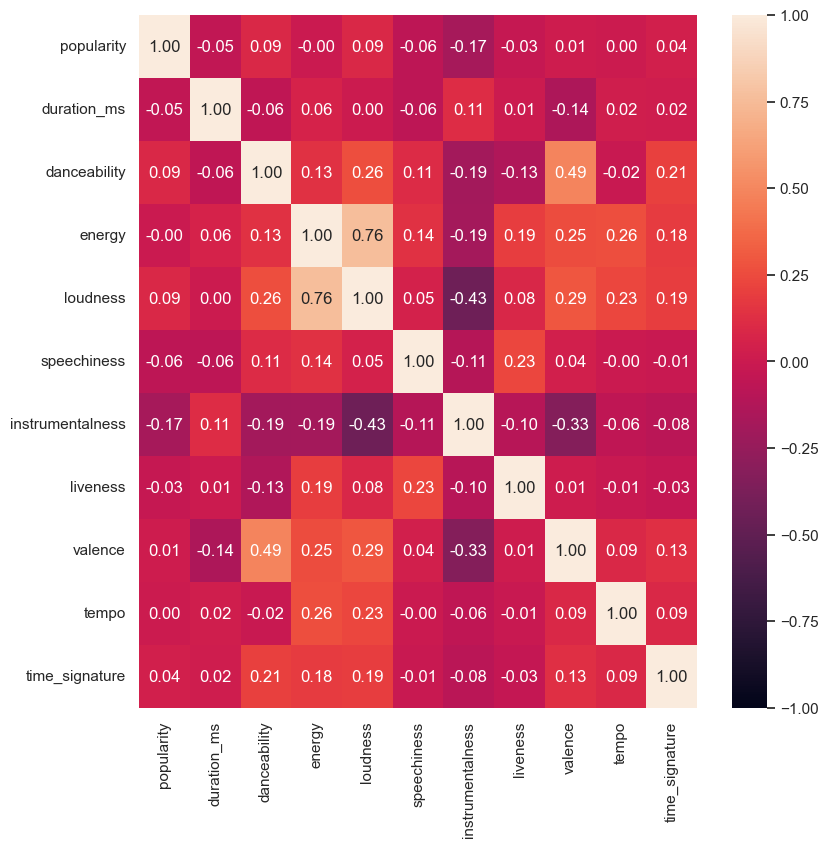

In [14]:
musicdata_num = musicdata.drop(["artists", "explicit", "acousticness", "key", "mode"], axis = 1)
musicdata_num.head()

f = plt.figure(figsize=(9, 9))
sb.heatmap(musicdata_num.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

This correlation matrix shows that popularity has no direct correlation with any other factors. This means that it is largely down to the user's personal preference and not due to a particular audio feature.

It is also noted that in most of the factors, there are no strong direct correlation with any other factors as well.

The notable exceptions to this would be:

1. Energy & Loudness - It has a very strong positive correlation of 0.76

2. Valence & Danceability - It has a strong positive correlation of 0.49

3. Instrumentalness & Loudness - It has a strong negative correlation of -0.43

As such, we cannot simply just recommend another popular song to the user after he/she has added a new song as it is very unlikely to be what the user preferred to listen.

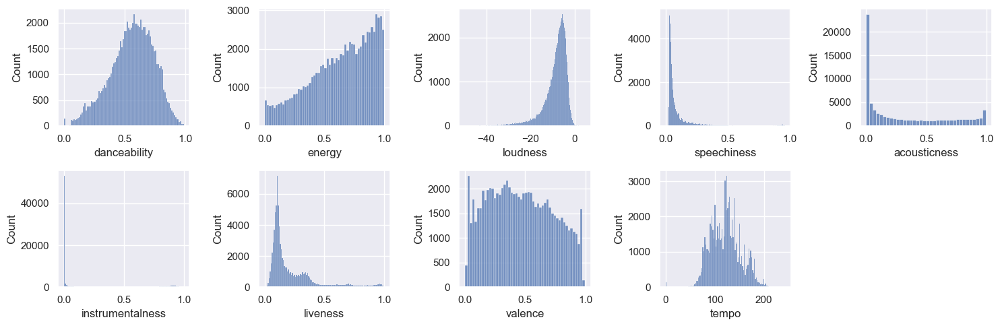

In [15]:
floats = []
for col in musicdata.columns:
  if musicdata[col].dtype == 'float':
    floats.append(col)

len(floats)

plt.subplots(figsize = (15, 5))
for i, col in enumerate(floats):
  plt.subplot(2, 5, i + 1)
  sb.histplot(musicdata[col])
plt.tight_layout()
plt.show()

Based on this set of graphs, the following is noted that:

1. Half of the audio features is more positively skewed (Instrumentalness, Speechiness, Acousticness, Liveness)

2. Energy and Valence have a normal distribution

3. Danceability has an almost symmetrical distribution but is a bit negatively skewed

4. Loudness is more negatively skewed

In [16]:
cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10, verbose=False))], verbose=False)

X = musicdata.select_dtypes(np.number)
cluster_pipeline.fit(X)
cluster_plot = cluster_pipeline.predict(X)
musicdata['cluster_label'] = cluster_plot

In [17]:
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
songs = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=songs)
projection['title'] = musicdata['track_name']
projection['cluster'] = musicdata['cluster_label']

In [18]:
fig = px.scatter(projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [19]:
musicdata_sample = musicdata.sample(n = 25) #random sampling

In [20]:
musicdata_sample = musicdata_sample.sort_values(by=['track_genre'], ascending = False)
musicdata.head(25)

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,songlists,cluster_label
0,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,...,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic,Gen HoshinoComedy,1
1,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,...,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic,Ben WoodwardGhost - Acoustic,2
2,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,...,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic,Ingrid Michaelson;ZAYNTo Begin Again,2
3,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,...,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic,Kina GrannisCan't Help Falling In Love,2
4,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,...,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic,Chord OverstreetHold On,2
5,Tyrone Wells,Days I Will Remember,Days I Will Remember,58,214240,False,0.688,0.4810,6,-8.807,...,0.1050,0.2890,0.000000,0.1890,0.6660,98.017,4,acoustic,Tyrone WellsDays I Will Remember,5
6,A Great Big World;Christina Aguilera,Is There Anybody Out There?,Say Something,74,229400,False,0.407,0.1470,2,-8.822,...,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3,acoustic,A Great Big World;Christina AguileraSay Something,2
7,Jason Mraz,We Sing. We Dance. We Steal Things.,I'm Yours,80,242946,False,0.703,0.4440,11,-9.331,...,0.0417,0.5590,0.000000,0.0973,0.7120,150.960,4,acoustic,Jason MrazI'm Yours,5
8,Jason Mraz;Colbie Caillat,We Sing. We Dance. We Steal Things.,Lucky,74,189613,False,0.625,0.4140,0,-8.700,...,0.0369,0.2940,0.000000,0.1510,0.6690,130.088,4,acoustic,Jason Mraz;Colbie CaillatLucky,5
9,Ross Copperman,Hunger,Hunger,56,205594,False,0.442,0.6320,1,-6.770,...,0.0295,0.4260,0.004190,0.0735,0.1960,78.899,4,acoustic,Ross CoppermanHunger,2


We used KMeans algorithm to cluster the data into 10 separate clusters.

Based on this scatter plot & the subsequent "musicdata" table that contained a sample size of 25 songs, it shows that similar types of songs tends to be clustered together. 

It is noted from the "Musicdata" sample table, similar genres also tends to be classified together. Additionally in the scatter plot, songs from different clusters tends to be near to each other barring some of the outliers. 

Thus, it can be concluded that songs from different genres can have similar audio features to each other as such, could still be recommended to the user as it might close to what the user prefers.

# Machine Learning & Prediction

1. Song Recommendation based on Single Song Input

For this portion, we are trying to implement a song recommendation system by converting the song's audio into a vector and then comparing it with the other existing songs within the playlist using the cosine similarity formula shown below.

<img src = 'image.png' width = 500 height = 500>

After comparing, sort the table by popularity & similarity. Thereafter, recommend some songs to the user that is close to what the user just chosen. 

Due to the size of the music data, the computational time for the cosine similarity will simply take too long. As such, we have decided to limit the dataset. But to determine what will be good size, we decided to conduct some test with 10K, 20K, 30K, 40K and 50K as the sample size.

After conducting some trials (refer to "Proof of Concept XXK.ipynb" files in Proof of Concept Folder), we discovered that 20K is the best for the purpose of the project as it has minimal difference in the song recommendation for the searched songs. Furthermore, as compared to the 30K sample size, it only took half the amount of time to generate the recommended songs.

This lead to us concluding that the difference is mainly caused by the fact that the songs that is most similar to the searched song is less popular. As such, with an increase in the size of the data, the songs that were more similar to the searched song but less popular were recommended to the user.

In [21]:
musicdf = musicdata
musicdata = musicdata.sort_values(by=['popularity'], ascending = False).head(20000)

The CounterVectorizer() is used to convert the genres that is present in the dataset into a matrix of token counts for later use by the recommended song function.

In [22]:
genre_vectors = CountVectorizer()
genre_vectors.fit(musicdata['track_genre'])

CountVectorizer()

In [23]:
def recommended_songs(song_name):
    
    data = musicdata

    #If the song could not be found within the dataset
    if data[data['track_name'] == song_name].shape[0] == 0:
        
        print('This song is not available. Here are some other popular songs that you may like:\n')
        suggested_music_list = data.nlargest(100, 'popularity')
        suggested_music = suggested_music_list.sample(n = 5)

        return display(suggested_music[['artists', 'track_name', 'album_name']])
    
    #If the song could be found within the dataset
    song_input_array1 = genre_vectors.transform(data[data['track_name'] == song_name]['track_genre']).toarray() 
    #for text comparison
    song_input_array2 = data[data['track_name']==song_name].select_dtypes(include = np.number).to_numpy() 
    #for other numeric factors comparison
   
    similarity_index = []
    for index, row in data.iterrows():
        song = row['track_name']
     
        # Getting vector for existing songs in the playlist.
        existing_song_array1 = genre_vectors.transform(data[data['track_name'] == song]['track_genre']).toarray()
        #for text comparison
        existing_song_array2 = data[data['track_name'] == song].select_dtypes(include = np.number).to_numpy()
        #for other numeric factors comparison
 
        # Calculating similarities for text as well as numeric features
        text_similarity = cosine_similarity(song_input_array1, existing_song_array1)[0][0]
        feature_similarity = cosine_similarity(song_input_array2, existing_song_array2)[0][0]
        
        #adding the results into the array created
        similarity_index.append(text_similarity + feature_similarity)
 
    data['similarity'] = similarity_index
    
    data.sort_values(by=['similarity'], ascending = [False], inplace=True)
   
    display("This song is available. Here are some other similar songs that you may like:" ,
            data[['artists', 'track_name', 'album_name']][1:6]) 
    #Ignore song 1 as it is just the input song itself

This program seeks to acquire the song input from the user and converts it features into array items. Thereafter, uses cosine similarities to check the how similar it is to existing songs within the dataset and append the similarity value into the similarity index. We then input this data into the dataframe and sort the data by the similarity value. Finally, chooses 5 songs to recommend to the user.

In [24]:
def get_user_input():
    ref = 0
    while True:
        
        if(ref > 0):
            print("--------------------------------------------------------------------------------")
        ref+=1
        print("Please enter the song that you're looking for:")
        print("Enter 'stop' if you wish to stop searching for other songs.\n")
        x = input()
        if (x == "stop"):
            print("Thank you for using our services :)")
            break;
        print("Please wait... We are currently checking for you...")
        recommended_songs(x)

Through this program, the user can enter as many song search as they wish and the program will only stop when user enters "stop". 

In [25]:
get_user_input()

Please enter the song that you're looking for:
Enter 'stop' if you wish to stop searching for other songs.

Efecto
Please wait... We are currently checking for you...


'This song is available. Here are some other similar songs that you may like:'

,artists,track_name,album_name
67353,Daddy Yankee,Gasolina,Barrio Fino (Bonus Track Version)
67359,Bad Bunny,Tití Me Preguntó,Un Verano Sin Ti
67801,Rauw Alejandro;Lyanno;Brray,LOKERA,LOKERA
67552,Rvssian;Rauw Alejandro;Chris Brown,Nostálgico,Nostálgico
67450,Bad Bunny;Drake,MIA (feat. Drake),MIA (feat. Drake)


--------------------------------------------------------------------------------
Please enter the song that you're looking for:
Enter 'stop' if you wish to stop searching for other songs.

Love Someone
Please wait... We are currently checking for you...


'This song is available. Here are some other similar songs that you may like:'

,artists,track_name,album_name
465,Joshua Hyslop,Wells,Wells
582,Matt Nathanson,All We Are,Some Mad Hope
783,Drew Holcomb & The Neighbors,I Like to Be With Me When I'm With You,A Million Miles Away
56,Aron Wright,Build It Better,Build It Better
581,Tristan Prettyman,Say Anything,Cedar + Gold


--------------------------------------------------------------------------------
Please enter the song that you're looking for:
Enter 'stop' if you wish to stop searching for other songs.

Love Me Like You Do
Please wait... We are currently checking for you...


'This song is available. Here are some other similar songs that you may like:'

,artists,track_name,album_name
376,Boyce Avenue,Love Me Like You Do,"Cover Sessions, Vol. 4"
323,Ciaran Lavery,Left for America,Kosher
5,Tyrone Wells,Days I Will Remember,Days I Will Remember
479,Peter Bradley Adams,My Arms Were Always Around You,A Face Like Mine
525,Joshua Radin,You're My Home,The Ghost and the Wall


--------------------------------------------------------------------------------
Please enter the song that you're looking for:
Enter 'stop' if you wish to stop searching for other songs.

I Ain't Worried
Please wait... We are currently checking for you...


'This song is available. Here are some other similar songs that you may like:'

,artists,track_name,album_name
79108,Elton John,I'm Still Standing,Too Low For Zero
79102,OneRepublic,I Ain’t Worried - Acoustic,I Ain’t Worried - Acoustic (Music From The Mot...
79433,Anna Landström,Song for Teddy,Song for Teddy
79206,Davignon,Dualities,Dualities
79405,Anne Vallayer,Matin,Matin


--------------------------------------------------------------------------------
Please enter the song that you're looking for:
Enter 'stop' if you wish to stop searching for other songs.

hi
Please wait... We are currently checking for you...
This song is not available. Here are some other popular songs that you may like:



,artists,track_name,album_name
81657,Olivia Rodrigo,traitor,SOUR
20001,Sam Smith;Kim Petras,Unholy (feat. Kim Petras),Unholy (feat. Kim Petras)
103154,Omar Apollo,Evergreen (You Didn’t Deserve Me At All),Ivory
68866,Bad Bunny,Un Coco,Un Verano Sin Ti
20030,benny blanco;BTS;Snoop Dogg,Bad Decisions (with BTS & Snoop Dogg),Bad Decisions (with BTS & Snoop Dogg)


--------------------------------------------------------------------------------
Please enter the song that you're looking for:
Enter 'stop' if you wish to stop searching for other songs.

stop
Thank you for using our services :)


For the function, "recommended_songs", we first convert the input song & existing songs within the playlist into an array object. We then used the cosine similarity to figure out how similar are the existing songs and the input song in terms of text and other numeric features. Thereafter we added the similarity figures for the text and other numeric features before appending it into the newly created similarity column.

After all that is done, we proceeded to sort the data by similarity as to ensure that the song which is most similar to what the user looked could be recommended to the user.

There is also a safeguard, in the event that the user entered an song that is unavailable, the program would proceed to recommend any 5 songs from the top 100 most popular songs that exists within the database for the user to consider adding onto their playlist.

2. Song Recommendation based on a given playlist

However, it is not always the case that a user listens to only one song. We would like to explore his last few songs, we shall look into his last 10 songs to recommend the next 5 songs.

We will be using **Content-based Filtering** for our recommendation engine.

To start off, there are 3 kinds of process to include into the pipeline of a song recommendation:

1.   One-Hot Encoding
2.   Normalization
3.   TF-IDF

**One Hot Encoding conversion** for audio features such as *key*, *explicit*, *mode* and *time signature*

One Hot Encoding (OHE) converts our audio features into a DataFrame that will be readable by the engine. 

For example, there are two values in explicit "True" or "False". OHE conversion will split the audio feature (explicit) into two columns

<img src = 'One-Hot-Encoding-for-Scikit-Learn-in-Python-Explained-1024x576.png' width = 500 height = 500>

In [26]:
def ohe_conversion (df, column, new_name):
    ''' 
    Create One Hot Encoded features of a specific column
    ---
    Input: 
    df (pandas dataframe): musicdata Dataframe
    column (str): Column to be processed
    new_name (str): new column name to be used
        
    Output: 
    tf_df: One-hot encoded features 
    '''
    tf_df = pd.get_dummies(df[column])
    feature_names = tf_df.columns
    tf_df.columns = [new_name + ":" + str(i) for i in feature_names]
    tf_df.reset_index(drop = True, inplace = True)    
    return tf_df

**Normalisation**

Normalises audio feature with "float-64" dtype between 1 and 0.

<img src = 'download.png' width = 500 height = 500>

In [27]:
def normalisation_conversion(df, column_list, multiplier = 1):
  ''' 
    Normalises an audio feature between 1 and 0
    ---
    Input: 
    df (pandas dataframe): musicdata Dataframe
    column_list : Column to be processed
    multiplier (int) : if audio feature requires adjustment, use multiplier
        
    Output: 
    tf_df: returns normalised audio feature
  '''
  extracted_data = df[column_list].reset_index(drop = True)
  scaler = MinMaxScaler()
  scaled_extracted_data =  pd.DataFrame(scaler.fit_transform(extracted_data), columns = extracted_data.columns) * multiplier
  return scaled_extracted_data

**TF-IDF**

<img src = 'td-idf-graphic.png' width = 500 height = 500>

**Feature Generation**

With the functions above, we concatenate all audio features into a new dataframe.

*create_function_set* handles audio features of the songs in the dataframe and separates each features into a column for the engine to make comparison in our recommendation engine

In [28]:
def create_feature_set(float_cols, df = musicdata):
    '''
    Process spotify df to create a final set of features that will be used to generate recommendations
    ---
    Input: 
    df (pandas dataframe): music/playlist Dataframe
    float_cols (list(str)): List of float columns that will be scaled
            
    Output: 
    final (pandas dataframe): Final set of features 
    '''
    
    # Tfidf genre lists
    tfidf = TfidfVectorizer()
    tfidf_matrix =  tfidf.fit_transform(df['track_genre'])
    genre_df = pd.DataFrame(tfidf_matrix.toarray())
    genre_df.columns = ['genre' + "|" + i for i in tfidf.get_feature_names_out()]
    genre_df.reset_index(drop = True, inplace=True)
    genre_df.iloc[0]

    # One-hot Encoding
    explicit_ohe = ohe_conversion(df, 'explicit', 'explicit')
    key_ohe = ohe_conversion(df, 'key', 'key')
    mode_ohe = ohe_conversion(df, 'mode', 'mode')
    time_signature_ohe = ohe_conversion(df, 'time_signature', 'time_signature')
    
    # Normalization
    popularity_normal = normalisation_conversion(df, ["popularity"])
    audio_normal = normalisation_conversion(df, float_cols)

    # Concanenate all features
    final = pd.concat([explicit_ohe, key_ohe, mode_ohe, time_signature_ohe, popularity_normal, audio_normal, genre_df], axis = 1)

    # Add song id
    final['track_name']=df['track_name'].values
    
    return final

**Sum of audio feature**

*generate_playlist_feature* functions into combining all of the audio features into one vector

In [29]:
def generate_playlist_feature(complete_feature_set, playlist_df):
    '''
    Summarize a user's playlist into a single vector
    ---
    Input:
    complete_feature_set (pandas dataframe): Dataframe which includes all of the features for the spotify songs
    playlist_df (pandas dataframe): playlist dataframe
        
    Output: 
    complete_feature_set_playlist_final (pandas series): single vector feature that summarizes the playlist
    '''

    # Find song features in the playlist
    complete_feature_set_playlist = complete_feature_set[complete_feature_set['track_name'].isin(playlist_df['track_name'].values)]
    # Removes track name from the final vector of audio features, leaving only audio features
    complete_feature_set_playlist_final = complete_feature_set_playlist.drop(columns = "track_name")
    return complete_feature_set_playlist_final.sum(skipna = False, axis = 0, min_count = 0)

**Recommendation Engine**


Here we take in the single vector of features of user's last 10 played songs and will compare it with the rest of the songs in our 20,000 songs (not inclusive of the 10 songs the user has listened to) and return the user another 10 more songs of close similarity through "cosine_similarity"


In [30]:
def recommend_songs_based_on_vector(features, nonplaylist_features, num_recommend, df):

    '''
    Generated recommendation based on songs in a specific playlist.
    ---
    Input: 
    df (pandas dataframe): spotify dataframe
    features (pandas series): summarized playlist feature (single vector)
    nonplaylist_features (pandas dataframe): feature set of songs that are not in the selected playlist
    num_recomend (int): number of recommendations for playlist
        
    Output: 
    non_playlist_df_top_few: Top "num_recommend" recommendations for that playlist
    '''
    
    non_playlist_df = df[df['track_name'].isin(nonplaylist_features['track_name'].values)]
    # Find cosine similarity between the playlist and the complete song set
    non_playlist_df['sim'] = cosine_similarity(nonplaylist_features.drop('track_name', axis = 1).values, features.reshape(1, -1))[:,0]
    non_playlist_df_top_few = non_playlist_df.sort_values('sim',ascending = False).head(num_recommend)
    
    return non_playlist_df_top_few

**Hypothetical User**

Let's create a hypothetical user that have listened to 10 songs beforehand and have our recommendation engine make the recommendation based on the previous 10 songs. 

In [31]:
# Lets pick out 10 random songs from the dataframe and assume 
# these 10 random songs are what the user has last listened to

last_few_music = musicdata.sample(n = 10)
display(last_few_music[['track_name', 'artists']])

,track_name,artists
56355,Cloud 9,Paravi
23801,Imagination,Gorgon City;Katy Menditta
80980,Aaye Ho Meri Zindagi Mein - Male Version,Udit Narayan
90359,Moody Blue,Elvis Presley
99419,CHICKEN TENDIES,Clinton Kane
80492,Main Pal Do Pal Ka Shair Hoon,Mukesh
65640,Queen of Hearts,TWICE
37244,Chute No Balde,MC Joãozinho VT;Mc Kako;DJ WN;Mc Kanhoto;MC Le...
72068,NOT JUST BREATHING,The Plot In You
36250,Me & U,TWOPILOTS


**Feature Calculation**

balance_playlist and balance_playlist_features are the remainder songs out of the top 20, 000 songs and are put into function (create_feature_set) to produce a dataframe of audio feature data

In [32]:
balance_playlist = musicdata.append(last_few_music).drop_duplicates(keep = False)
float_cols = balance_playlist.dtypes[balance_playlist.dtypes == 'float64'].index.values
balance_playlist_features = create_feature_set(float_cols,balance_playlist)
balance_playlist_features.shape

C:\Users\Dino\AppData\Local\Temp\ipykernel_20092\201394864.py:1: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



(19990, 141)

In [33]:
balance_playlist_features.columns

Index(['explicit:False', 'explicit:True', 'key:0', 'key:1', 'key:2', 'key:3',
       'key:4', 'key:5', 'key:6', 'key:7',
       ...
       'genre|swedish', 'genre|synth', 'genre|techno', 'genre|tonk',
       'genre|trance', 'genre|trip', 'genre|tunes', 'genre|turkish',
       'genre|world', 'track_name'],
      dtype='object', length=141)

<img src = 'cosine_sim_2.png' width = 500 height = 500>

**Recommendation**

This portion below are the steps into getting our recommendation engine to recommend 10 new songs to the user. 

We pass in the users last played songs and tried to get the audio features (dataframe) from the songs. However, a problem appears, we see that the balance_playlist_features have a shape of (19990 songs and 140 audio details) but our user's songs only have (10 songs and 37 audio details). This will cause our "cosine_similarity" to be unable to properly compare the other 19990 songs.

In [34]:
float_cols = last_few_music.dtypes[last_few_music.dtypes == 'float64'].index.values

# Create the audio feature dataframe of our user's last played songs
complete_features_playlist = create_feature_set(float_cols, last_few_music)
complete_features_playlist.shape

(10, 37)

In [35]:
complete_features_playlist.columns

Index(['explicit:False', 'key:0', 'key:4', 'key:6', 'key:7', 'key:8', 'key:9',
       'key:10', 'key:11', 'mode:0', 'mode:1', 'time_signature:3',
       'time_signature:4', 'popularity', 'danceability', 'energy', 'loudness',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'similarity', 'genre|deep', 'genre|film',
       'genre|french', 'genre|funk', 'genre|house', 'genre|indie',
       'genre|metalcore', 'genre|pop', 'genre|rock', 'genre|roll',
       'genre|singer', 'genre|songwriter', 'track_name'],
      dtype='object')

We will fill in the missing columns in user's playlist feature (complete_features_playlist) and fill those data as 0. This will help our recommendation engine to properly compare similarities

In [36]:
# Include missing columns into the features for our hypothetical user's last played songs
complete_features_playlist = complete_features_playlist.reindex(columns = balance_playlist_features.columns, fill_value = 0)
complete_features_playlist.shape

(10, 141)

After filling in the missing audio features to be similar with our music audio feature dataframe, we are now able to properly compare them.

We then convert our feature dataframe into a single summed vector and later converting it again to an array of size (1 row x 140 columns)

After all the conversions, we pass in the user last 10 songs array and the balance songs' features into the recommendation engine. The engine later provides us with 10 new songs and the similarity value between the song and the last 10 songs

In [37]:
# Combine the data and summed into one vector
complete_feature_set_playlist_vector = generate_playlist_feature(complete_features_playlist, last_few_music)
# Convert the vector into an array of only one row
complete_feature_set_playlist_array = complete_feature_set_playlist_vector.to_numpy().reshape(1, -1)

# Recommend 10 songs
recommend = recommend_songs_based_on_vector(complete_feature_set_playlist_array, balance_playlist_features, 10, balance_playlist)
display(recommend[["track_name", "artists", "sim"]])

,track_name,artists,sim
79133,All The Right Moves,OneRepublic,0.856920
79320,Bennie And The Jets - Remastered 2014,Elton John,0.856203
87554,Rhythm of the Rain,The Cascades,0.854766
79479,Great Balls Of Fire - 1964 Version,Jerry Lee Lewis,0.849390
79145,Two Birds,Regina Spektor,0.849113
81939,"Adipoli (From ""Think Originals"")",Siddhu Kumar;Vineeth Sreenivasan;K. Sivaangi,0.846367
79000,I Ain't Worried,OneRepublic,0.845299
80134,"Heer Raanjhana (From ""Bachchhan Paandey"")",Amaal Mallik;Arijit Singh;Shreya Ghoshal,0.844156
79051,Hold Me Closer,Elton John;Britney Spears,0.844136
65912,Heartbeat,SURAN,0.844070


# Constraints of this project

1. Due to the long computational time, we are unable to use the whole dataset for the recommendation program. Thus, we had to cap the amount at roughly 1/4 of the total dataset. This may have caused us the ability to recommend another song that is far more similar but less popular which may be closer to what the user likes. This is because, as mentioned earlier, popularity do not have any direct correlation with any other audio features.


2. We were unable to find a suitably big dataset that contains the user data as well as the audio features of the songs for analysis. As such, we were unable to analyse what user would typically listen to based on geographical location in the world. 